In [3]:
# load the data
import pandas as pd
# plot a graph showing each stat cause and its count 
import matplotlib.pyplot as plt
import seaborn as sns

data = pd.read_csv('data.csv')
# remove Unnamed: 0 column
data = data.drop(columns='Unnamed: 0')
# print number of rows 
print(data.shape[0])

571425


In [4]:
def validate_long_lat(X_train, X_test, X_val, mode_values):
    most_common_lat = mode_values['LATITUDE']
    most_common_long = mode_values['LATITUDE']

    for df in [X_train, X_test, X_val]:
        lat_invalid_mask = (df['LATITUDE'] < -90) | (df['LATITUDE'] > 90)
        df.loc[lat_invalid_mask, 'LATITUDE'] = most_common_lat

        long_invalid_mask = (df['LONGITUDE'] < -180) | (df['LONGITUDE'] > 180)
        df.loc[long_invalid_mask, 'LONGITUDE'] = most_common_long
    return X_train, X_test, X_val

In [5]:
def replace_null_with_mode(X_train, X_test, X_val):
    mode_values_train = X_train.mode().iloc[0]

    # the mode amount of time between the discovery date and cont_date in the train is 0
    # so we are setting the CONT_DATE to be the DISCOVERY_DATE for missing values
    for df in [X_train, X_test, X_val]:
        null_mask = df['CONT_DOY'].isnull()
        df.loc[null_mask, 'CONT_DOY'] = df.loc[null_mask, 'DISCOVERY_DOY']

    X_train, X_test, X_val = validate_long_lat(X_train, X_test, X_val, mode_values_train[['LATITUDE', 'LONGITUDE']])

    # replacing the rest of the missing values with the mode value in the train
    X_train.fillna(mode_values_train, inplace=True)
    X_val.fillna(mode_values_train, inplace=True)
    X_test.fillna(mode_values_train, inplace=True)

    return X_train, X_test, X_val

In [6]:
# split to train, test and validation
from sklearn.model_selection import train_test_split

train, test = train_test_split(data, test_size=0.2, random_state=42)
train, val = train_test_split(train, test_size=0.2, random_state=42)

y_train = train['STAT_CAUSE_DESCR']
X_train = train.drop(columns='STAT_CAUSE_DESCR')
y_test = test['STAT_CAUSE_DESCR']
X_test = test.drop(columns='STAT_CAUSE_DESCR')
y_val = val['STAT_CAUSE_DESCR']
X_val = val.drop(columns='STAT_CAUSE_DESCR')

X_train, X_test, X_val = replace_null_with_mode(X_train, X_test, X_val)
# remove duplicates rows from train and validation
X_train = X_train.drop_duplicates()
X_train.head(100)

,OBJECTID,FOD_ID,FPA_ID,SOURCE_SYSTEM_TYPE,SOURCE_SYSTEM,NWCG_REPORTING_AGENCY,NWCG_REPORTING_UNIT_ID,NWCG_REPORTING_UNIT_NAME,SOURCE_REPORTING_UNIT,SOURCE_REPORTING_UNIT_NAME,...,FIRE_SIZE_CLASS,LATITUDE,LONGITUDE,OWNER_CODE,OWNER_DESCR,STATE,COUNTY,FIPS_CODE,FIPS_NAME,Shape
271458,1058342,1188453,TFS_NC_237540,NONFED,ST-NCNCS,ST/C&L,USNCNCS,North Carolina Forest Service,NCNCS309,NCS Region 3 District 9,...,B,35.133300,-82.866700,14.0,MISSING/NOT SPECIFIED,NC,5,5.0,Lincoln,b'\x00\x01\xad\x10\x00\x00\\\xdcF\x03x\xb7T\xc...
529009,751509,851450,SDVFD_375,NONFED,ST-SDSDS,ST/C&L,USSDMURX,Murdo Volunteer Fire Department,SDMURX,Murdo Volunteer Fire Department,...,B,43.825190,-100.830040,8.0,PRIVATE,SD,5,5.0,Lincoln,b'\x00\x01\xad\x10\x00\x00\xc8\x97\x17`\x1f5Y\...
41725,1489236,201159521,2011GAGAS-FY2011-Clay-019,NONFED,ST-NASF,ST/C&L,USGAGAS,Georgia Forestry Commission,GAGAS,Georgia Forestry Commission,...,A,31.596940,-85.056379,7.0,STATE,GA,Clay,61.0,Clay,b'\x00\x01\xad\x10\x00\x00\xf4\xc7\x8b\xb7\x9b...
26943,487751,524793,SFO-MN0349-2803,NONFED,ST-NASF,ST/C&L,USMNMNS,Minnesota Department of Natural Resources,MNMNS,Minnesota Department of Natural Resources,...,C,45.945374,-93.996576,14.0,MISSING/NOT SPECIFIED,MN,Morrison,97.0,Morrison,b'\x00\x01\xad\x10\x00\x00\x1c\xb4\x81\xe8\xc7...
94305,1431968,19904633,AL-WA-1994-70-002,NONFED,ST-ALALS,ST/C&L,USALALS,Alabama Forestry Commission,ALALS,Alabama Forestry Commission,...,B,31.573970,-88.304400,14.0,MISSING/NOT SPECIFIED,AL,WA,129.0,Washington,b'\x00\x01\xad\x10\x00\x00\xc09#J{\x13V\xc0\xa...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284419,514144,554185,SFO-NC01350606-0841,NONFED,ST-NASF,ST/C&L,USNCNCS,North Carolina Forest Service,NCNCS,North Carolina Division of Forest Resources,...,C,34.769300,-76.840480,14.0,MISSING/NOT SPECIFIED,NC,Carteret,31.0,Carteret,b'\x00\x01\xad\x10\x00\x00H<\xa0l\xca5S\xc0h\x...
553077,1569736,201436074,FS-1511056,FED,FS-FIRESTAT,FS,USWAOWF,Okanogan/Wenatchee National Forest,0617,Wenatchee National Forest,...,A,46.650278,-121.409167,5.0,USFS,WA,077,77.0,Yakima,b'\x00\x01\xad\x10\x00\x00\xd8\x90f\xc9/Z^\xc0...
133584,1536232,201391941,TFS-TXFD2009-223254,NONFED,ST-TXTXS,ST/C&L,USTXTXS,Texas A & M Forest Service,TXVFD,Lake Arrowhead VFD,...,B,33.754691,-98.334270,13.0,STATE OR PRIVATE,TX,Clay,77.0,Clay,b'\x00\x01\xad\x10\x00\x00\x90\x1f\xc8\xacd\x9...
87027,1748408,300088964,SFO-2014CACDFBTU000709,NONFED,ST-NASF,ST/C&L,USCABTU,Butte Unit,CABTU,Butte Unit,...,A,39.755900,-121.581750,14.0,MISSING/NOT SPECIFIED,CA,BUTTE,7.0,Butte,b'\x00\x01\xad\x10\x00\x00\xa8\x1cZd;e^\xc0\xf...


In [7]:
print(X_val.isnull().sum().sum())
print(X_train.isnull().sum().sum())
print(X_test.isnull().sum().sum())

0
0
0


**delete-**

 OBJECTID, FOD_ID, FPA, SHAPE, DISCOVERY_DATE ,


Not sure -
- FIRE_CODE, FIRE_CODE,  CONT_DATE, LOCAL_FIRE_REPORT_ID, LOCAL_INCIDENT_ID, 


**add-**
- add binary column of if there was an holliday in that day

- DISCOVERY_DOY- transform to season

- DISCOVERY_TIME - transform to Morning, Noon, Afternoon, Evening, Night, LateNight


Notfindinfo about- -

SOURCE_REPORTING_UNIT -




**categotical features** - 

- SOURCE_SYSTEM_TYPE - שלוש אופציות - פדרלי או ביןסוכנות)סוג מסד הנתונים או מערכת שהרשומה נלקחה ממנה.


- SOURCE_SYSTEM - שם של או מזהה אחר עבור מסד נתונים מקור או
מערכת שממנה נשאב הרשומה.

- NWCG_REPORTING_AGENCY - מזהה יחידה של הקבוצה  עבור הסוכנות המכינה את דוח השריפה

- NWCG_REPORTING_UNIT_ID - מזהה יחידת NWCG פעיל עבור
יחידה המכינה את דו"ח השריפה.

- NWCG_REPORTING_UNIT_NAME - שם יחידת NWCG פעיל עבור
יחידה המכינה את דו"ח השריפה.

- SOURCE_REPORTING_UNIT_NAME -
שם יחידת סוכנות הדיווח
הכנת דוח האש, בהתבסס על קוד/שם במערך הנתונים של המקור.

In [8]:
# create a column with the season of the fire, based on DISCOVERY DOY
def generate_season_column(data_frame):
    # create a dictionary with the season for each month
    seasons = {1: 'Winter', 2: 'Winter', 3: 'Spring', 4: 'Spring', 5: 'Spring', 6: 'Summer', 7: 'Summer', 8: 'Summer',
               9: 'Fall', 10: 'Fall', 11: 'Fall', 12: 'Winter'}
    # iterate over the rows and add the season to the new column
    for index, row in data_frame.iterrows():
        if row['DISCOVERY_DOY'] == 366:  # in case it was a leap year
            month_number = 12
        else:
            month_number = int((row['DISCOVERY_DOY'] // 30.44) + 1)
        data_frame.at[index, 'SEASON'] = seasons[month_number]
    return data_frame

In [9]:
# # add the season column to the data
X_train = generate_season_column(X_train)
X_test = generate_season_column(X_test)
X_val = generate_season_column(X_val)
X_train.head(100)

,OBJECTID,FOD_ID,FPA_ID,SOURCE_SYSTEM_TYPE,SOURCE_SYSTEM,NWCG_REPORTING_AGENCY,NWCG_REPORTING_UNIT_ID,NWCG_REPORTING_UNIT_NAME,SOURCE_REPORTING_UNIT,SOURCE_REPORTING_UNIT_NAME,...,LATITUDE,LONGITUDE,OWNER_CODE,OWNER_DESCR,STATE,COUNTY,FIPS_CODE,FIPS_NAME,Shape,SEASON
271458,1058342,1188453,TFS_NC_237540,NONFED,ST-NCNCS,ST/C&L,USNCNCS,North Carolina Forest Service,NCNCS309,NCS Region 3 District 9,...,35.133300,-82.866700,14.0,MISSING/NOT SPECIFIED,NC,5,5.0,Lincoln,b'\x00\x01\xad\x10\x00\x00\\\xdcF\x03x\xb7T\xc...,Spring
529009,751509,851450,SDVFD_375,NONFED,ST-SDSDS,ST/C&L,USSDMURX,Murdo Volunteer Fire Department,SDMURX,Murdo Volunteer Fire Department,...,43.825190,-100.830040,8.0,PRIVATE,SD,5,5.0,Lincoln,b'\x00\x01\xad\x10\x00\x00\xc8\x97\x17`\x1f5Y\...,Summer
41725,1489236,201159521,2011GAGAS-FY2011-Clay-019,NONFED,ST-NASF,ST/C&L,USGAGAS,Georgia Forestry Commission,GAGAS,Georgia Forestry Commission,...,31.596940,-85.056379,7.0,STATE,GA,Clay,61.0,Clay,b'\x00\x01\xad\x10\x00\x00\xf4\xc7\x8b\xb7\x9b...,Spring
26943,487751,524793,SFO-MN0349-2803,NONFED,ST-NASF,ST/C&L,USMNMNS,Minnesota Department of Natural Resources,MNMNS,Minnesota Department of Natural Resources,...,45.945374,-93.996576,14.0,MISSING/NOT SPECIFIED,MN,Morrison,97.0,Morrison,b'\x00\x01\xad\x10\x00\x00\x1c\xb4\x81\xe8\xc7...,Spring
94305,1431968,19904633,AL-WA-1994-70-002,NONFED,ST-ALALS,ST/C&L,USALALS,Alabama Forestry Commission,ALALS,Alabama Forestry Commission,...,31.573970,-88.304400,14.0,MISSING/NOT SPECIFIED,AL,WA,129.0,Washington,b'\x00\x01\xad\x10\x00\x00\xc09#J{\x13V\xc0\xa...,Spring
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284419,514144,554185,SFO-NC01350606-0841,NONFED,ST-NASF,ST/C&L,USNCNCS,North Carolina Forest Service,NCNCS,North Carolina Division of Forest Resources,...,34.769300,-76.840480,14.0,MISSING/NOT SPECIFIED,NC,Carteret,31.0,Carteret,b'\x00\x01\xad\x10\x00\x00H<\xa0l\xca5S\xc0h\x...,Spring
553077,1569736,201436074,FS-1511056,FED,FS-FIRESTAT,FS,USWAOWF,Okanogan/Wenatchee National Forest,0617,Wenatchee National Forest,...,46.650278,-121.409167,5.0,USFS,WA,077,77.0,Yakima,b'\x00\x01\xad\x10\x00\x00\xd8\x90f\xc9/Z^\xc0...,Fall
133584,1536232,201391941,TFS-TXFD2009-223254,NONFED,ST-TXTXS,ST/C&L,USTXTXS,Texas A & M Forest Service,TXVFD,Lake Arrowhead VFD,...,33.754691,-98.334270,13.0,STATE OR PRIVATE,TX,Clay,77.0,Clay,b'\x00\x01\xad\x10\x00\x00\x90\x1f\xc8\xacd\x9...,Summer
87027,1748408,300088964,SFO-2014CACDFBTU000709,NONFED,ST-NASF,ST/C&L,USCABTU,Butte Unit,CABTU,Butte Unit,...,39.755900,-121.581750,14.0,MISSING/NOT SPECIFIED,CA,BUTTE,7.0,Butte,b'\x00\x01\xad\x10\x00\x00\xa8\x1cZd;e^\xc0\xf...,Winter


<Axes: xlabel='SEASON', ylabel='count'>

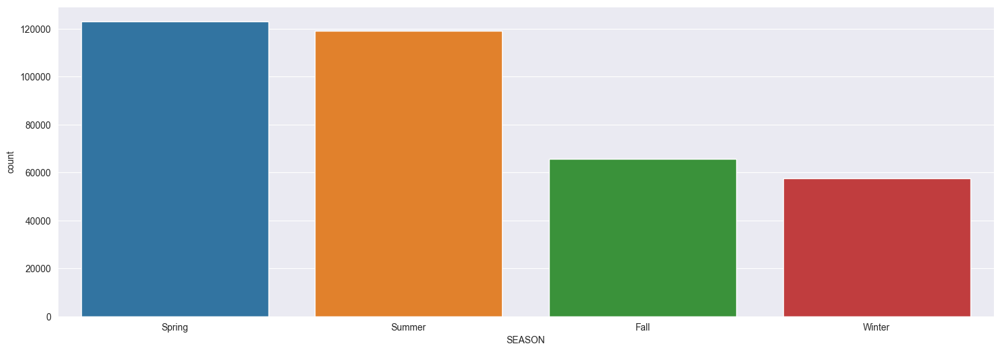

In [10]:
# plot a graph showing the number of fires in each season
plt.figure(figsize=(18, 6))
sns.countplot(x="SEASON", data=X_train, order=X_train['SEASON'].value_counts().index)

In [11]:
def generate_time_of_day_column(data_frame):
    # create a dictionary with the time of the day for each hour
    time_of_day = {0: 'Late Night', 1: 'Late Night', 2: 'Late Night', 3: 'Late Night', 4: 'Night', 5: 'Night',
                   6: 'Night', 7: 'Night', 8: 'Morning', 9: 'Morning', 10: 'Morning', 11: 'Morning', 12: 'Noon',
                   13: 'Noon', 14: 'Noon', 15: 'Noon', 16: 'Afternoon', 17: 'Afternoon', 18: 'Afternoon',
                   19: 'Afternoon', 20: 'Evening', 21: 'Evening', 22: 'Evening', 23: 'Evening'}
    data_frame['TIME_OF_DAY'] = (data_frame['DISCOVERY_TIME'] // 100).astype(int).map(time_of_day)
    return data_frame

In [12]:
X_train = generate_time_of_day_column(X_train)
X_test = generate_time_of_day_column(X_test)
X_val = generate_time_of_day_column(X_val)
X_train.head(100)

,OBJECTID,FOD_ID,FPA_ID,SOURCE_SYSTEM_TYPE,SOURCE_SYSTEM,NWCG_REPORTING_AGENCY,NWCG_REPORTING_UNIT_ID,NWCG_REPORTING_UNIT_NAME,SOURCE_REPORTING_UNIT,SOURCE_REPORTING_UNIT_NAME,...,LONGITUDE,OWNER_CODE,OWNER_DESCR,STATE,COUNTY,FIPS_CODE,FIPS_NAME,Shape,SEASON,TIME_OF_DAY
271458,1058342,1188453,TFS_NC_237540,NONFED,ST-NCNCS,ST/C&L,USNCNCS,North Carolina Forest Service,NCNCS309,NCS Region 3 District 9,...,-82.866700,14.0,MISSING/NOT SPECIFIED,NC,5,5.0,Lincoln,b'\x00\x01\xad\x10\x00\x00\\\xdcF\x03x\xb7T\xc...,Spring,Noon
529009,751509,851450,SDVFD_375,NONFED,ST-SDSDS,ST/C&L,USSDMURX,Murdo Volunteer Fire Department,SDMURX,Murdo Volunteer Fire Department,...,-100.830040,8.0,PRIVATE,SD,5,5.0,Lincoln,b'\x00\x01\xad\x10\x00\x00\xc8\x97\x17`\x1f5Y\...,Summer,Noon
41725,1489236,201159521,2011GAGAS-FY2011-Clay-019,NONFED,ST-NASF,ST/C&L,USGAGAS,Georgia Forestry Commission,GAGAS,Georgia Forestry Commission,...,-85.056379,7.0,STATE,GA,Clay,61.0,Clay,b'\x00\x01\xad\x10\x00\x00\xf4\xc7\x8b\xb7\x9b...,Spring,Noon
26943,487751,524793,SFO-MN0349-2803,NONFED,ST-NASF,ST/C&L,USMNMNS,Minnesota Department of Natural Resources,MNMNS,Minnesota Department of Natural Resources,...,-93.996576,14.0,MISSING/NOT SPECIFIED,MN,Morrison,97.0,Morrison,b'\x00\x01\xad\x10\x00\x00\x1c\xb4\x81\xe8\xc7...,Spring,Noon
94305,1431968,19904633,AL-WA-1994-70-002,NONFED,ST-ALALS,ST/C&L,USALALS,Alabama Forestry Commission,ALALS,Alabama Forestry Commission,...,-88.304400,14.0,MISSING/NOT SPECIFIED,AL,WA,129.0,Washington,b'\x00\x01\xad\x10\x00\x00\xc09#J{\x13V\xc0\xa...,Spring,Noon
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284419,514144,554185,SFO-NC01350606-0841,NONFED,ST-NASF,ST/C&L,USNCNCS,North Carolina Forest Service,NCNCS,North Carolina Division of Forest Resources,...,-76.840480,14.0,MISSING/NOT SPECIFIED,NC,Carteret,31.0,Carteret,b'\x00\x01\xad\x10\x00\x00H<\xa0l\xca5S\xc0h\x...,Spring,Noon
553077,1569736,201436074,FS-1511056,FED,FS-FIRESTAT,FS,USWAOWF,Okanogan/Wenatchee National Forest,0617,Wenatchee National Forest,...,-121.409167,5.0,USFS,WA,077,77.0,Yakima,b'\x00\x01\xad\x10\x00\x00\xd8\x90f\xc9/Z^\xc0...,Fall,Noon
133584,1536232,201391941,TFS-TXFD2009-223254,NONFED,ST-TXTXS,ST/C&L,USTXTXS,Texas A & M Forest Service,TXVFD,Lake Arrowhead VFD,...,-98.334270,13.0,STATE OR PRIVATE,TX,Clay,77.0,Clay,b'\x00\x01\xad\x10\x00\x00\x90\x1f\xc8\xacd\x9...,Summer,Noon
87027,1748408,300088964,SFO-2014CACDFBTU000709,NONFED,ST-NASF,ST/C&L,USCABTU,Butte Unit,CABTU,Butte Unit,...,-121.581750,14.0,MISSING/NOT SPECIFIED,CA,BUTTE,7.0,Butte,b'\x00\x01\xad\x10\x00\x00\xa8\x1cZd;e^\xc0\xf...,Winter,Noon


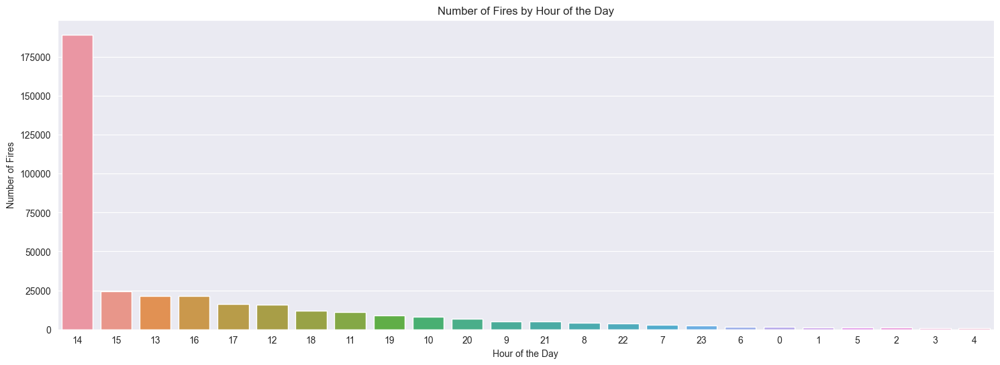

In [13]:
discovery_time_by_24 = (X_train['DISCOVERY_TIME'] // 100).astype(int)

plt.figure(figsize=(18, 6))
sns.countplot(x=discovery_time_by_24, order=discovery_time_by_24.value_counts().index)

plt.title('Number of Fires by Hour of the Day')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Fires')
plt.show()

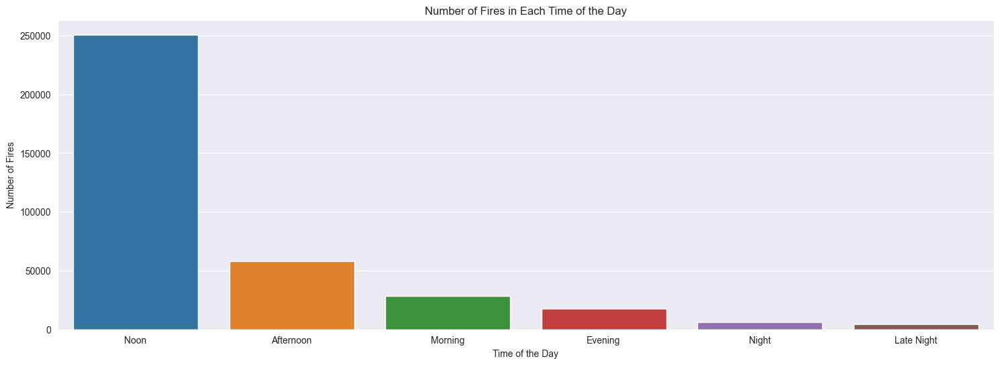

In [14]:
# plot a graph showing the number of fires for each of the time of the day labnles
plt.figure(figsize=(18, 6))
sns.countplot(x="TIME_OF_DAY", data=X_train, order=X_train['TIME_OF_DAY'].value_counts().index)
plt.title('Number of Fires in Each Time of the Day')
plt.xlabel('Time of the Day')
plt.ylabel('Number of Fires')
plt.show()

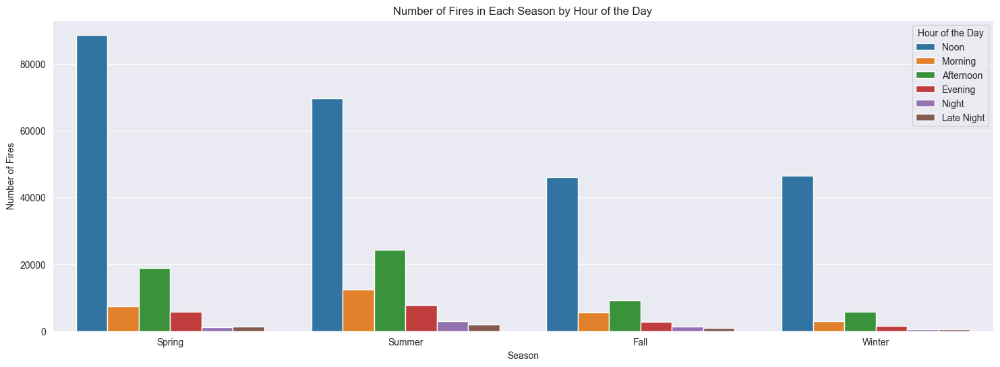

In [15]:
plt.figure(figsize=(18, 6))
sns.countplot(x="SEASON", hue="TIME_OF_DAY", data=X_train,
              order=X_train['SEASON'].value_counts().index)
plt.title('Number of Fires in Each Season by Hour of the Day')
plt.xlabel('Season')
plt.ylabel('Number of Fires')
plt.legend(title='Hour of the Day')
plt.show()

number of cases for each fire cause 

Text(0, 0.5, 'Number of Cases')

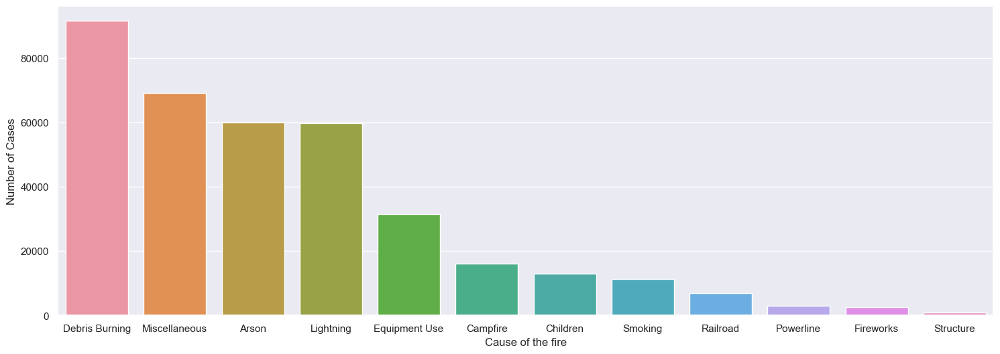

In [16]:
sns.set(style="darkgrid")
plt.figure(figsize=(18, 6))
ax = sns.countplot(x="STAT_CAUSE_DESCR", data=train, order=y_train.value_counts().index)
# add x and y labels
plt.xlabel('Cause of the fire')
plt.ylabel('Number of Cases')

In [17]:
%pip install holidays
import holidays


def generate_holiday_column(data_frame):
    min_year = data_frame['FIRE_YEAR'].min()
    max_year = data_frame['FIRE_YEAR'].max()

    us_holidays = holidays.US(years=[i for i in range(min_year, max_year + 1)])
    bank_holidays = holidays.NYSE(years=[i for i in range(min_year, max_year + 1)])
    joined_holidays = {**us_holidays, **bank_holidays}

    holidays_data = {
        'day_of_year': [date.timetuple().tm_yday for date in us_holidays.keys()],
        'year': [date.year for date in us_holidays.keys()],
        'holiday': list(us_holidays.values())
    }
    holidays_df = pd.DataFrame(holidays_data)

    data_frame = pd.merge(data_frame, holidays_df, left_on=['FIRE_YEAR', 'DISCOVERY_DOY'],
                          right_on=['year', 'day_of_year'], how='left')
    data_frame = data_frame.drop(['year', 'day_of_year'], axis=1)
    data_frame['holiday'] = data_frame['holiday'].fillna('')
    return data_frame

Note: you may need to restart the kernel to use updated packages.


In [18]:
X_train = generate_holiday_column(X_train)
X_test = generate_holiday_column(X_test)
X_val = generate_holiday_column(X_val)
X_train.head(100)

,OBJECTID,FOD_ID,FPA_ID,SOURCE_SYSTEM_TYPE,SOURCE_SYSTEM,NWCG_REPORTING_AGENCY,NWCG_REPORTING_UNIT_ID,NWCG_REPORTING_UNIT_NAME,SOURCE_REPORTING_UNIT,SOURCE_REPORTING_UNIT_NAME,...,OWNER_CODE,OWNER_DESCR,STATE,COUNTY,FIPS_CODE,FIPS_NAME,Shape,SEASON,TIME_OF_DAY,holiday
0,1058342,1188453,TFS_NC_237540,NONFED,ST-NCNCS,ST/C&L,USNCNCS,North Carolina Forest Service,NCNCS309,NCS Region 3 District 9,...,14.0,MISSING/NOT SPECIFIED,NC,5,5.0,Lincoln,b'\x00\x01\xad\x10\x00\x00\\\xdcF\x03x\xb7T\xc...,Spring,Noon,
1,751509,851450,SDVFD_375,NONFED,ST-SDSDS,ST/C&L,USSDMURX,Murdo Volunteer Fire Department,SDMURX,Murdo Volunteer Fire Department,...,8.0,PRIVATE,SD,5,5.0,Lincoln,b'\x00\x01\xad\x10\x00\x00\xc8\x97\x17`\x1f5Y\...,Summer,Noon,
2,1489236,201159521,2011GAGAS-FY2011-Clay-019,NONFED,ST-NASF,ST/C&L,USGAGAS,Georgia Forestry Commission,GAGAS,Georgia Forestry Commission,...,7.0,STATE,GA,Clay,61.0,Clay,b'\x00\x01\xad\x10\x00\x00\xf4\xc7\x8b\xb7\x9b...,Spring,Noon,
3,487751,524793,SFO-MN0349-2803,NONFED,ST-NASF,ST/C&L,USMNMNS,Minnesota Department of Natural Resources,MNMNS,Minnesota Department of Natural Resources,...,14.0,MISSING/NOT SPECIFIED,MN,Morrison,97.0,Morrison,b'\x00\x01\xad\x10\x00\x00\x1c\xb4\x81\xe8\xc7...,Spring,Noon,
4,1431968,19904633,AL-WA-1994-70-002,NONFED,ST-ALALS,ST/C&L,USALALS,Alabama Forestry Commission,ALALS,Alabama Forestry Commission,...,14.0,MISSING/NOT SPECIFIED,AL,WA,129.0,Washington,b'\x00\x01\xad\x10\x00\x00\xc09#J{\x13V\xc0\xa...,Spring,Noon,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,514144,554185,SFO-NC01350606-0841,NONFED,ST-NASF,ST/C&L,USNCNCS,North Carolina Forest Service,NCNCS,North Carolina Division of Forest Resources,...,14.0,MISSING/NOT SPECIFIED,NC,Carteret,31.0,Carteret,b'\x00\x01\xad\x10\x00\x00H<\xa0l\xca5S\xc0h\x...,Spring,Noon,
96,1569736,201436074,FS-1511056,FED,FS-FIRESTAT,FS,USWAOWF,Okanogan/Wenatchee National Forest,0617,Wenatchee National Forest,...,5.0,USFS,WA,077,77.0,Yakima,b'\x00\x01\xad\x10\x00\x00\xd8\x90f\xc9/Z^\xc0...,Fall,Noon,
97,1536232,201391941,TFS-TXFD2009-223254,NONFED,ST-TXTXS,ST/C&L,USTXTXS,Texas A & M Forest Service,TXVFD,Lake Arrowhead VFD,...,13.0,STATE OR PRIVATE,TX,Clay,77.0,Clay,b'\x00\x01\xad\x10\x00\x00\x90\x1f\xc8\xacd\x9...,Summer,Noon,
98,1748408,300088964,SFO-2014CACDFBTU000709,NONFED,ST-NASF,ST/C&L,USCABTU,Butte Unit,CABTU,Butte Unit,...,14.0,MISSING/NOT SPECIFIED,CA,BUTTE,7.0,Butte,b'\x00\x01\xad\x10\x00\x00\xa8\x1cZd;e^\xc0\xf...,Winter,Noon,


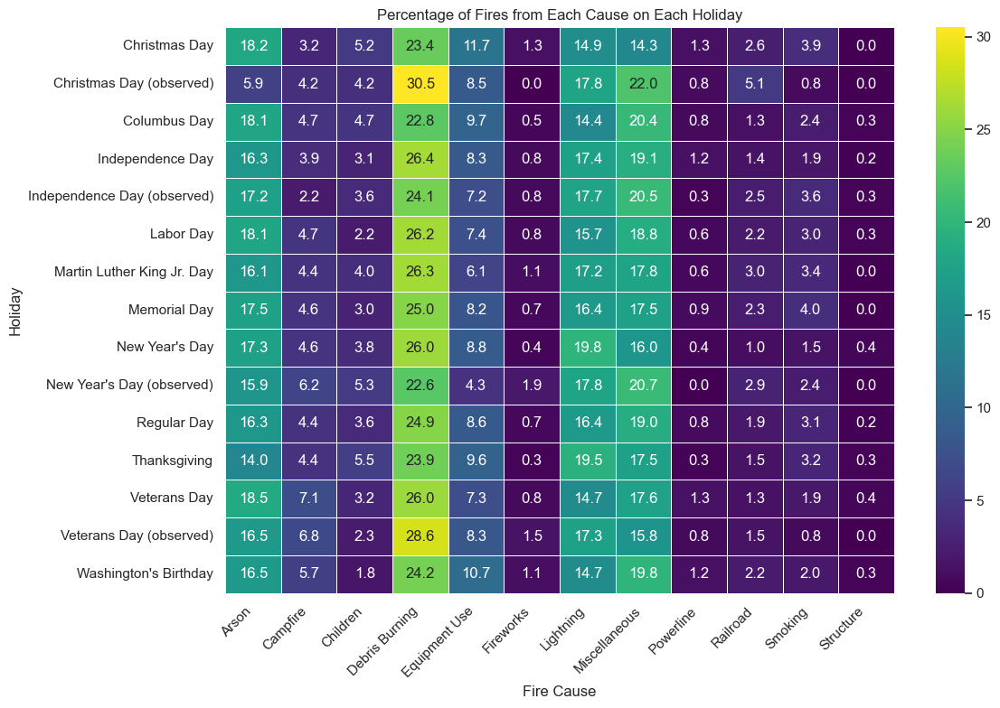

In [19]:
import matplotlib.pyplot as plt
import seaborn as sns

wildfire_data = X_train.copy()
wildfire_data['FIRE_CAUSE'] = y_train
wildfire_data['holiday'] = wildfire_data['holiday'].replace('', 'Regular Day')

# Group by 'holiday' and 'FIRE_CAUSE' and calculate the count
grouped_data = wildfire_data.groupby(['holiday', 'FIRE_CAUSE']).size().reset_index(name='count')

# Calculate the percentage of fires from each cause out of all fires on that holiday

grouped_data['percentage'] = grouped_data.groupby('holiday')['count'].transform(lambda x: (x / x.sum()) * 100)

# Add 'Regular Day' to the grouped data
grouped_data.loc[grouped_data['holiday'] == '', 'holiday'] = 'Regular Day'

# Pivot the data for easier plotting
pivot_data = grouped_data.pivot(index='holiday', columns='FIRE_CAUSE', values='percentage').fillna(0)

# Plotting the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_data, cmap='viridis', annot=True, fmt=".1f", linewidths=.5)
plt.title('Percentage of Fires from Each Cause on Each Holiday')
plt.xlabel('Fire Cause')
plt.ylabel('Holiday')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels
plt.tight_layout()
plt.show()

In [20]:
# print number of null values in each column
print((X_train.isnull().sum() == 0).all())
print((X_test.isnull().sum() == 0).all())
print((X_val.isnull().sum() == 0).all())

True
True
True


In [21]:
# visualize the data on a map, use folium
# show in the map the number of fires in each location
import folium
from folium.plugins import HeatMap

# find center of the map
center = [X_train['LATITUDE'].mean(), X_train['LONGITUDE'].mean()]
# create the map
m = folium.Map(location=center, zoom_start=4)
# add the heat map
heat_data = [[row['LATITUDE'], row['LONGITUDE']] for index, row in X_train.iterrows()]
HeatMap(heat_data, radius=10, blur=7).add_to(m)
# display the map
m

In [22]:
categorical_features = ['SOURCE_SYSTEM_TYPE', 'SOURCE_SYSTEM', 'NWCG_REPORTING_AGENCY', 'NWCG_REPORTING_UNIT_ID',
                        'NWCG_REPORTING_UNIT_NAME', 'SOURCE_REPORTING_UNIT_NAME', 'SOURCE_REPORTING_UNIT',
                        'ICS_209_INCIDENT_NUMBER',
                        'ICS_209_NAME', 'MTBS_ID', 'MTBS_FIRE_NAME', 'COMPLEX_NAME', 'FIRE_SIZE_CLASS',
                        'OWNER_CODE', 'OWNER_DESCR', 'STATE', 'COUNTY', 'FIPS_CODE', 'STAT_CAUSE_DESCR',
                        'TIME_OF_DAY', 'SEASON', 'holiday']
not_sure_categories = ['FIRE_CODE', 'FIPS_NAME']
categorical_features += not_sure_categories
# 
# # use cramers v to find the correlation between the categorical features
# import numpy as np
# import scipy.stats as ss
# 
# 
# def cramers_v(confusion_matrix):
#     chi2 = ss.chi2_contingency(confusion_matrix)[0]
#     n = confusion_matrix.sum()
#     phi2 = chi2 / n
#     r, k = confusion_matrix.shape
#     phi2corr = max(0, phi2 - ((k - 1) * (r - 1)) / (n - 1))
#     rcorr = r - ((r - 1) ** 2) / (n - 1)
#     kcorr = k - ((k - 1) ** 2) / (n - 1)
#     return np.sqrt(phi2corr / min((kcorr - 1), (rcorr - 1)))
# 
# # create a dataframe with the categorical features
# # categorical_df = pd.concat([X_train, y_train], axis=1)
# categorical_df = X_train.copy()
# categorical_df['STAT_CAUSE_DESCR'] = y_train
# 
# # add the train y to the categorical df 
# categorical_df = categorical_df[categorical_features]
# 
# #encode the data using label encoding, and then calculate the correlation between the features using cramers v
# from sklearn.preprocessing import LabelEncoder
# 
# label_encoder = LabelEncoder()
# categorical_df_encoded = categorical_df.apply(label_encoder.fit_transform)
# categorical_df_encoded = categorical_df_encoded.astype('int64')
# 
# # calculate the correlation between the features
# categorical_features_corr = np.zeros((len(categorical_features), len(categorical_features)))
# for i in range(len(categorical_features)):
#     for j in range(len(categorical_features)):
#         confusion_matrix = pd.crosstab(categorical_df_encoded[categorical_features[i]],
#                                        categorical_df_encoded[categorical_features[j]]).values
#         categorical_features_corr[i, j] = cramers_v(confusion_matrix)
# #         
# # create a dataframe with the correlation between the features
# categorical_features_corr_df = pd.DataFrame(categorical_features_corr, columns=categorical_features,
#                                             index=categorical_features)
# 
# # plot the correlation between the features, show the values in the cells
# plt.figure(figsize=(24, 10))
# sns.heatmap(categorical_features_corr_df, annot=True, cmap='coolwarm')

In [23]:
# # create a dictionary where the key is the feature and the value is a list containing the names of features that are
# # highly correlated with the key feature (0.8 and above) without the feature itself
# highly_correlated_features = {}
# for i in range(len(categorical_features)):
#     for j in range(len(categorical_features)):
#         if i != j and categorical_features_corr[i, j] >= 0.79: # TODO: try the models with different thresholds
#             highly_correlated_features[categorical_features[i]] = highly_correlated_features.get(
#                 categorical_features[i], []) + [categorical_features[j]]
# # get the names of the features that arnt keys in highly_correlated_features
# categorical_features_to_keep = [feature for feature in categorical_features if feature not in highly_correlated_features]
# # while highly_correlated_features is not empty, choose the feature with the most highly correlated features and remove
# # each of the highly correlated features from the dictionary. Add the chosen feature to the list of feature to keep.
# while highly_correlated_features:
#     max_correlation = 0
#     max_correlation_feature = None
#     for feature, correlated_features in highly_correlated_features.items():
#         if len(correlated_features) > max_correlation:
#             max_correlation = len(correlated_features)
#             max_correlation_feature = feature
#     categorical_features_to_keep.append(max_correlation_feature)
#     for feature in highly_correlated_features[max_correlation_feature]:
#         if feature in highly_correlated_features:
#             del highly_correlated_features[feature]
#     del highly_correlated_features[max_correlation_feature]
# categorical_features_to_keep

check the correlation of the categorical features we kept

In [24]:
# # drop the features that are not in the features_to_keep list
# # show a heatmap of the correlation between the features, use the categorical_features_corr_df dataframe
# categorical_features_corr_df = categorical_features_corr_df.loc[categorical_features_to_keep, categorical_features_to_keep]
# plt.figure(figsize=(24, 10))
# sns.heatmap(categorical_features_corr_df, annot=True, cmap='coolwarm')

In [25]:
# # calculate the correlation between the numerical features
# #
#     
# columns_to_drop = ['OBJECTID','FOD_ID','FPA_ID','LOCAL_FIRE_REPORT_ID','FIRE_NAME','LOCAL_INCIDENT_ID','Shape']
# 
# numerical_features_to_keep = [feature for feature in X_train.columns.tolist() if feature not in categorical_features and feature not in columns_to_drop]
# 
# numerical_features_corr = X_train[numerical_features_to_keep].corr()
# # plot the correlation between the numerical features
# plt.figure(figsize=(24, 10))
# sns.heatmap(numerical_features_corr, annot=True, cmap='coolwarm')

we can see that the only columns with correlation higher than 0.8 are: FIRE_YEAR, DISCOVERY_DATE, CONT_DATE.
we got here a triangle of correlation between the 3 columns and the correlation of each pair is 1, 
so we can drop 2 of them and keep only one.

                                            DISCOVERY_DATE
                                             /          \
                                        CONT_DATE -- FIRE_YEAR
                             
we choose to keep FIRE_YEAR and drop the other 2 columns.

In [26]:
# # TODO: keep fire year instead of discovery date
# 
# if 'CONT_DATE' in numerical_features_to_keep:
#     numerical_features_to_keep.remove('CONT_DATE')
# if 'DISCOVERY_DATE' in numerical_features_to_keep:
#     numerical_features_to_keep.remove('DISCOVERY_DATE')    

In [27]:
# # TODO: calculate the correlation between the numerical and categorical features
# # use spearman correlation for the numerical features to keep and the categorical features to keep
# print(categorical_df.shape)
# print(categorical_df_encoded.shape)
# print(X_train[numerical_features_to_keep].shape)
# 
# # calculate the spearman correlation between the numerical and categorical features
# from scipy.stats import spearmanr
# print(categorical_features_to_keep)
# print(numerical_features_to_keep)
# numerical_categorical_corr = np.zeros((len(numerical_features_to_keep), len(categorical_features_to_keep)))
# for i in range(len(numerical_features_to_keep)):
#     for j in range(len(categorical_features_to_keep)):
#         spearman_corr, _ = spearmanr(X_train[numerical_features_to_keep[i]], categorical_df_encoded[categorical_features_to_keep[j]])
#         numerical_categorical_corr[i, j] = spearman_corr
# # create a dataframe with the correlation between the numerical and categorical features
# numerical_categorical_corr_df = pd.DataFrame(numerical_categorical_corr, columns=categorical_features_to_keep,
#                                              index=numerical_features_to_keep)
# # plot the correlation between the numerical and categorical features
# plt.figure(figsize=(24, 10))
# sns.heatmap(numerical_categorical_corr_df, annot=True, cmap='coolwarm')

we can see that fire size class and fire size are highly correlated, we can drop one of them.
we choose to drop fire size class.

In [28]:
# features_to_keep = numerical_features_to_keep + categorical_features_to_keep
# # drop fir size class 
# if 'FIRE_SIZE_CLASS' in features_to_keep:
#     features_to_keep.remove('FIRE_SIZE_CLASS')
#     categorical_features_to_keep.remove('FIRE_SIZE_CLASS')
# 
# 
# # remove label column - STAT_CAUSE_DESCR
# if 'STAT_CAUSE_DESCR' in features_to_keep:
#     features_to_keep.remove('STAT_CAUSE_DESCR')
#     categorical_features_to_keep.remove('STAT_CAUSE_DESCR')

# The result from the above code(20-25) is:
# TODO: uncomment previous code and remove the next line
features_to_keep = ['FIRE_YEAR',
                    'DISCOVERY_DOY',
                    'DISCOVERY_TIME',
                    'CONT_DOY',
                    'CONT_TIME',
                    'FIRE_SIZE',
                    'LATITUDE',
                    'LONGITUDE',
                    'TIME_OF_DAY',
                    'SEASON',
                    'holiday',
                    'FIRE_CODE',
                    'NWCG_REPORTING_UNIT_ID',
                    'ICS_209_INCIDENT_NUMBER',
                    'SOURCE_SYSTEM',
                    'COUNTY',
                    'OWNER_CODE']

categorical_features_to_keep = ['TIME_OF_DAY',
                                'SEASON',
                                'holiday',
                                'FIRE_CODE',
                                'NWCG_REPORTING_UNIT_ID',
                                'ICS_209_INCIDENT_NUMBER',
                                'SOURCE_SYSTEM',
                                'COUNTY',
                                'OWNER_CODE']

numerical_features_to_keep = ['FIRE_YEAR',
                              'DISCOVERY_DOY',
                              'DISCOVERY_TIME',
                              'CONT_DOY',
                              'CONT_TIME',
                              'FIRE_SIZE',
                              'LATITUDE',
                              'LONGITUDE']

X_train = X_train[features_to_keep]
X_test = X_test[features_to_keep]
X_val = X_val[features_to_keep]

X_train.head(100)

,FIRE_YEAR,DISCOVERY_DOY,DISCOVERY_TIME,CONT_DOY,CONT_TIME,FIRE_SIZE,LATITUDE,LONGITUDE,TIME_OF_DAY,SEASON,holiday,FIRE_CODE,NWCG_REPORTING_UNIT_ID,ICS_209_INCIDENT_NUMBER,SOURCE_SYSTEM,COUNTY,OWNER_CODE
0,2004,106,1400.0,106.0,1800.0,0.50,35.133300,-82.866700,Noon,Spring,,D44Z,USNCNCS,OK-OSA-100020,ST-NCNCS,5,14.0
1,1999,211,1400.0,211.0,1800.0,3.00,43.825190,-100.830040,Noon,Summer,,D44Z,USSDMURX,OK-OSA-100020,ST-SDSDS,5,8.0
2,2011,139,1525.0,139.0,1610.0,0.25,31.596940,-85.056379,Noon,Spring,,D44Z,USGAGAS,OK-OSA-100020,ST-NASF,Clay,7.0
3,2003,140,1400.0,140.0,1800.0,15.00,45.945374,-93.996576,Noon,Spring,,D44Z,USMNMNS,OK-OSA-100020,ST-NASF,Morrison,14.0
4,1994,70,1330.0,70.0,1800.0,0.30,31.573970,-88.304400,Noon,Spring,,D44Z,USALALS,OK-OSA-100020,ST-ALALS,WA,14.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,2006,64,1400.0,64.0,1800.0,25.00,34.769300,-76.840480,Noon,Spring,,D44Z,USNCNCS,OK-OSA-100020,ST-NASF,Carteret,14.0
96,2012,280,1400.0,286.0,1405.0,0.10,46.650278,-121.409167,Noon,Fall,,G9MD,USWAOWF,OK-OSA-100020,FS-FIRESTAT,077,5.0
97,2009,175,1400.0,175.0,1800.0,3.00,33.754691,-98.334270,Noon,Summer,,D44Z,USTXTXS,OK-OSA-100020,ST-TXTXS,Clay,13.0
98,2014,14,1400.0,14.0,1800.0,0.10,39.755900,-121.581750,Noon,Winter,,D44Z,USCABTU,OK-OSA-100020,ST-NASF,BUTTE,14.0


In [29]:
# print the number of distinct value for each column in categorical_features_to_keep
for feature in categorical_features_to_keep:
    print(f'{feature}: {X_train[feature].nunique()}')

TIME_OF_DAY: 6
SEASON: 4
holiday: 15
FIRE_CODE: 42807
NWCG_REPORTING_UNIT_ID: 1239
ICS_209_INCIDENT_NUMBER: 4666
SOURCE_SYSTEM: 32
COUNTY: 2835
OWNER_CODE: 16


In [30]:
from sklearn.metrics import roc_curve, auc
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import label_binarize
from itertools import cycle

In [31]:
def create_baseline_model():
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train.select_dtypes(exclude=['object']))
    X_val_scaled = scaler.transform(X_val.select_dtypes(exclude=['object']))
    baseline_model = LogisticRegression(max_iter=1000)
    baseline_model.fit(X_train_scaled, y_train)
    y_pred = baseline_model.predict(X_val_scaled)
    y_pred_proba = baseline_model.predict_proba(X_val_scaled)
    report = classification_report(y_val, y_pred, zero_division=0)
    return report, baseline_model, y_pred_proba

In [32]:
report, baseline_model, y_pred_proba = create_baseline_model()
print(report)

                precision    recall  f1-score   support

         Arson       0.29      0.06      0.10     14822
      Campfire       0.00      0.00      0.00      4129
      Children       0.00      0.00      0.00      3223
Debris Burning       0.34      0.74      0.47     22922
 Equipment Use       0.35      0.08      0.13      8032
     Fireworks       0.00      0.00      0.00       581
     Lightning       0.46      0.71      0.56     14762
 Miscellaneous       0.31      0.26      0.29     17365
     Powerline       0.00      0.00      0.00       755
      Railroad       0.00      0.00      0.00      1842
       Smoking       0.00      0.00      0.00      2788
     Structure       0.00      0.00      0.00       207

      accuracy                           0.37     91428
     macro avg       0.15      0.15      0.13     91428
  weighted avg       0.30      0.37      0.29     91428



In [33]:
def graph_roc(model, y_pred_proba):
    # Binarize the output
    y_val_bin = label_binarize(y_val, classes=model.classes_)
    n_classes = y_val_bin.shape[1]

    # Compute ROC curve and ROC area for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_val_bin[:, i], y_pred_proba[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Plot ROC curve for each class
    plt.figure(figsize=(10, 8))
    colors = cycle(
        ['blue', 'red', 'green', 'cyan', 'magenta', 'yellow', 'black', 'pink', 'lightblue', 'orange', 'purple',
         'brown'])
    for i, color in zip(range(n_classes), colors):
        plt.plot(fpr[i], tpr[i], color=color, lw=2,
                 label='ROC curve of class {0} (area = {1:0.2f})'
                       ''.format(model.classes_[i], roc_auc[i]))

    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic for each class')
    plt.legend(loc="lower right")
    plt.show()
    return roc_auc

In [34]:
def graph_auc(model, roc_auc):
    n_classes = len(model.classes_)

    # Plot AUC for each class
    plt.figure(figsize=(10, 8))
    colors = cycle(
        ['blue', 'red', 'green', 'cyan', 'magenta', 'yellow', 'black', 'pink', 'lightblue', 'orange', 'purple',
         'brown'])
    for i, color in zip(range(n_classes), colors):
        plt.bar(model.classes_[i], roc_auc[i], color=color,
                label='AUC of class {0} = {1:0.2f}'.format(model.classes_[i], roc_auc[i]))

    plt.xlabel('Class')
    plt.ylabel('Area Under Curve (AUC)')
    plt.title('AUC for each class')
    plt.legend(loc="upper right")
    plt.xticks(rotation=45)
    plt.show()

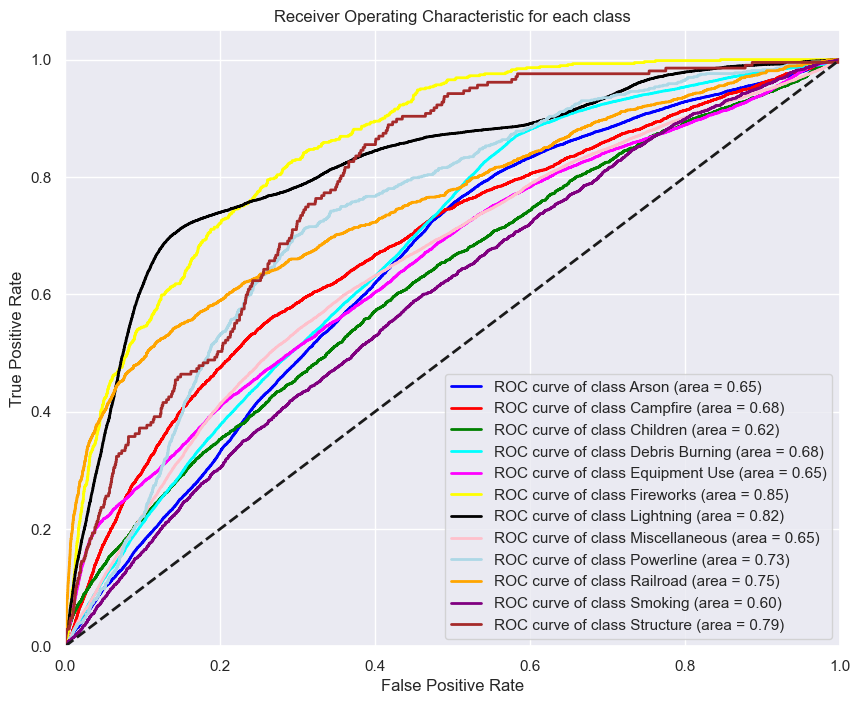

In [35]:
roc_auc = graph_roc(baseline_model, y_pred_proba)

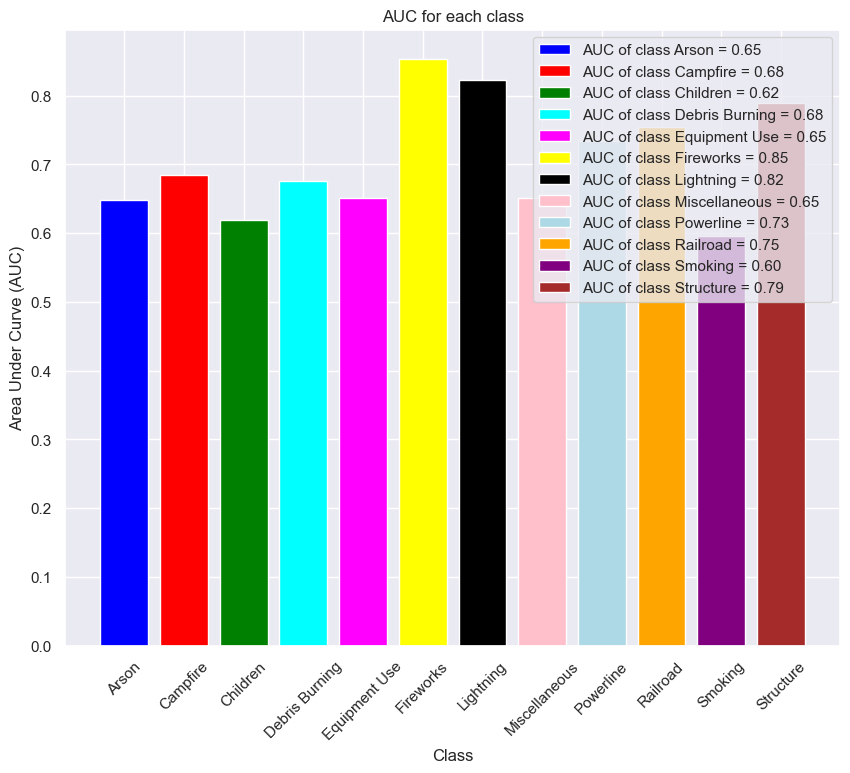

In [36]:
graph_auc(baseline_model, roc_auc)

Trying Different Models

In [37]:
# TODO: change fire code to label or frequency encoding, and check which one is better using the validation set
# TODO: use one hot encoding for the rest of the categorical features

In [38]:
from sklearn.preprocessing import OneHotEncoder


def one_hot(train_df, test_df, val_df, column_name, prefix=None):
    onehot_encoder = OneHotEncoder(handle_unknown='ignore')

    column_data_train = train_df[[column_name]]
    onehot_encoder.fit(column_data_train)

    for df in [train_df, test_df, val_df]:
        column_data = df[[column_name]]
        new_columns = onehot_encoder.transform(column_data)
        new_column_names = [prefix + str(category) for category in onehot_encoder.categories_[0]]
        new_columns_df = pd.DataFrame(new_columns.toarray(), columns=new_column_names, index=df.index)
        df[new_column_names] = new_columns_df
        df.drop(columns=[column_name], inplace=True)

    return train_df, test_df, val_df

In [39]:
# frequency encoding for ICS_209_INCIDENT_NUMBER, NWCG_REPORTING_UNIT_ID, COUNTY, FIRE_CODE
frequency_encoding_columns = ['ICS_209_INCIDENT_NUMBER', 'NWCG_REPORTING_UNIT_ID', 'COUNTY', 'FIRE_CODE']
for column in frequency_encoding_columns:
    frequency_map = X_train[column].value_counts(normalize=True)
    X_train[column] = X_train[column].map(frequency_map)
    X_test[column] = X_test[column].map(frequency_map)
    X_val[column] = X_val[column].map(frequency_map)

X_test.fillna(0, inplace=True)
X_val.fillna(0, inplace=True)

# use one hot encoding for the rest of the categorical features
for feature in categorical_features_to_keep:
    if feature not in frequency_encoding_columns:
        X_train, X_test, X_val = one_hot(X_train, X_test, X_val, feature, prefix=feature + '_')

In [40]:
pd.set_option('display.max_columns', None)
X_train.head(100)

,FIRE_YEAR,DISCOVERY_DOY,DISCOVERY_TIME,CONT_DOY,CONT_TIME,FIRE_SIZE,LATITUDE,LONGITUDE,FIRE_CODE,NWCG_REPORTING_UNIT_ID,ICS_209_INCIDENT_NUMBER,COUNTY,TIME_OF_DAY_Afternoon,TIME_OF_DAY_Evening,TIME_OF_DAY_Late Night,TIME_OF_DAY_Morning,TIME_OF_DAY_Night,TIME_OF_DAY_Noon,SEASON_Fall,SEASON_Spring,SEASON_Summer,SEASON_Winter,holiday_,holiday_Christmas Day,holiday_Christmas Day (observed),holiday_Columbus Day,holiday_Independence Day,holiday_Independence Day (observed),holiday_Labor Day,holiday_Martin Luther King Jr. Day,holiday_Memorial Day,holiday_New Year's Day,holiday_New Year's Day (observed),holiday_Thanksgiving,holiday_Veterans Day,holiday_Veterans Day (observed),holiday_Washington's Birthday,SOURCE_SYSTEM_DOI-WFMI,SOURCE_SYSTEM_FA-NFIRS,SOURCE_SYSTEM_FS-FIRESTAT,SOURCE_SYSTEM_FWS-FMIS,SOURCE_SYSTEM_IA-AKACC,SOURCE_SYSTEM_IA-ICS209,SOURCE_SYSTEM_ST-ALALS,SOURCE_SYSTEM_ST-ARARS,SOURCE_SYSTEM_ST-AZAZS,SOURCE_SYSTEM_ST-CACDF,SOURCE_SYSTEM_ST-COCOS,SOURCE_SYSTEM_ST-CTCTS,SOURCE_SYSTEM_ST-FLFLS,SOURCE_SYSTEM_ST-GAGAS,SOURCE_SYSTEM_ST-KYKYS,SOURCE_SYSTEM_ST-LALAS,SOURCE_SYSTEM_ST-MEMES,SOURCE_SYSTEM_ST-MIMIS,SOURCE_SYSTEM_ST-MOMOS,SOURCE_SYSTEM_ST-MSMSS,SOURCE_SYSTEM_ST-NASF,SOURCE_SYSTEM_ST-NCNCS,SOURCE_SYSTEM_ST-OKOKS,SOURCE_SYSTEM_ST-ORORS,SOURCE_SYSTEM_ST-SCSCS,SOURCE_SYSTEM_ST-SDSDS,SOURCE_SYSTEM_ST-TNTNS,SOURCE_SYSTEM_ST-TXTXS,SOURCE_SYSTEM_ST-VAVAS,SOURCE_SYSTEM_ST-WAWAS,SOURCE_SYSTEM_ST-WIWIS,SOURCE_SYSTEM_ST-WYWYS,OWNER_CODE_0.0,OWNER_CODE_1.0,OWNER_CODE_2.0,OWNER_CODE_3.0,OWNER_CODE_4.0,OWNER_CODE_5.0,OWNER_CODE_6.0,OWNER_CODE_7.0,OWNER_CODE_8.0,OWNER_CODE_9.0,OWNER_CODE_10.0,OWNER_CODE_11.0,OWNER_CODE_12.0,OWNER_CODE_13.0,OWNER_CODE_14.0,OWNER_CODE_15.0
0,2004,106,1400.0,106.0,1800.0,0.50,35.133300,-82.866700,0.819199,0.053176,0.986391,0.375481,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,1999,211,1400.0,211.0,1800.0,3.00,43.825190,-100.830040,0.819199,0.000019,0.986391,0.375481,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2011,139,1525.0,139.0,1610.0,0.25,31.596940,-85.056379,0.819199,0.097642,0.986391,0.000041,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2003,140,1400.0,140.0,1800.0,15.00,45.945374,-93.996576,0.819199,0.017243,0.986391,0.000984,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,1994,70,1330.0,70.0,1800.0,0.30,31.573970,-88.304400,0.819199,0.038128,0.986391,0.000221,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,2006,64,1400.0,64.0,1800.0,25.00,34.

In [41]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score, roc_curve
import numpy as np


def roc_graph_for_models(model_name, y_true, y_pred_proba):
    n_classes = y_pred_proba.shape[1]
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve((y_true == i).astype(int), y_pred_proba[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    plt.figure(figsize=(10, 8))
    # get random color for each class
    colors = ['red', 'blue', 'green', 'orange', 'purple', 'yellow', 'cyan', 'magenta', 'lime', 'pink', 'teal',
              'lavender']
    for i, color in zip(range(n_classes), colors):
        plt.plot(fpr[i], tpr[i], color=color, lw=2,
                 label='ROC curve of class {0} (area = {1:0.2f})'
                       ''.format(i, roc_auc[i]))

    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve - {}'.format(model_name))
    plt.legend(loc="lower right")
    plt.show()

In [42]:
def compare_models(models, y_train_encoded, y_val_encoded):
    # this function will get a dictionary of models and their names, and will return a dictionary with the auc value for each model
    auc_vals_dict = {}
    for model_name, model in models.items():
        model.fit(X_train, y_train_encoded)
        y_pred_proba = model.predict_proba(X_val)
        auc_vals_dict[model_name] = roc_auc_score(y_val_encoded, y_pred_proba, multi_class='ovr')
        # create graph for each model
        roc_graph_for_models(model_name, y_val_encoded, y_pred_proba)
    return auc_vals_dict

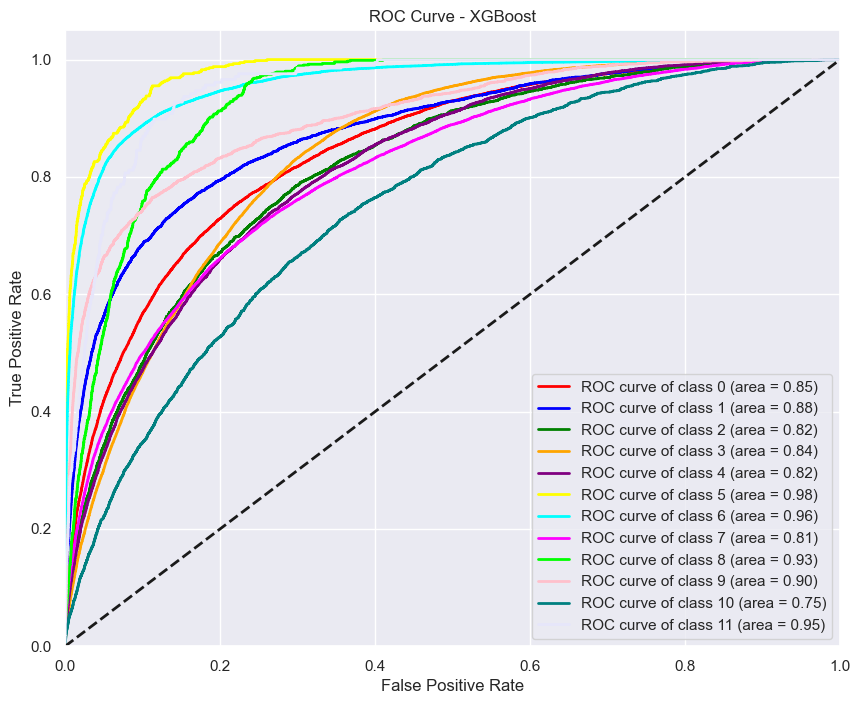

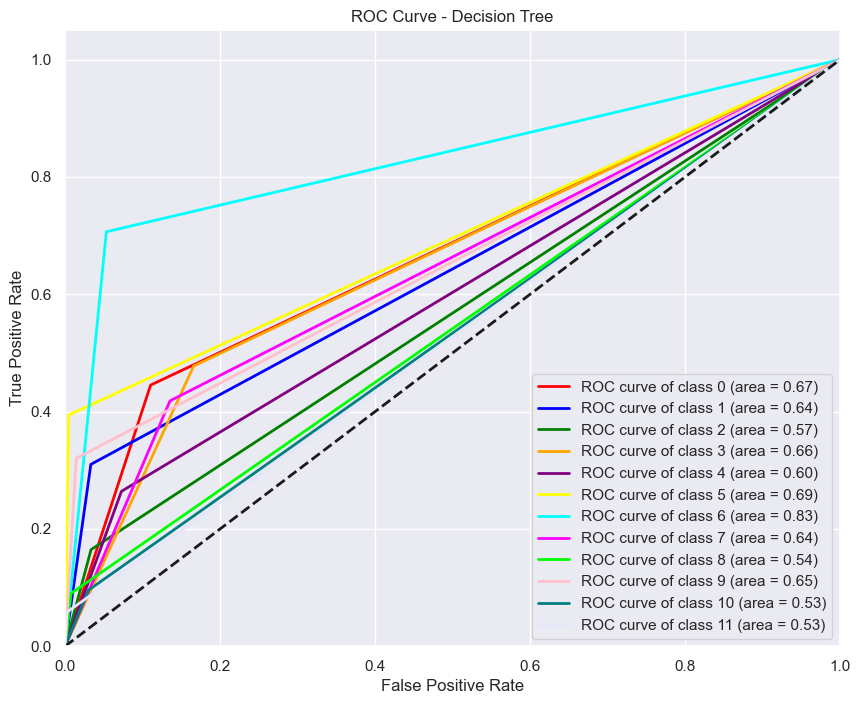

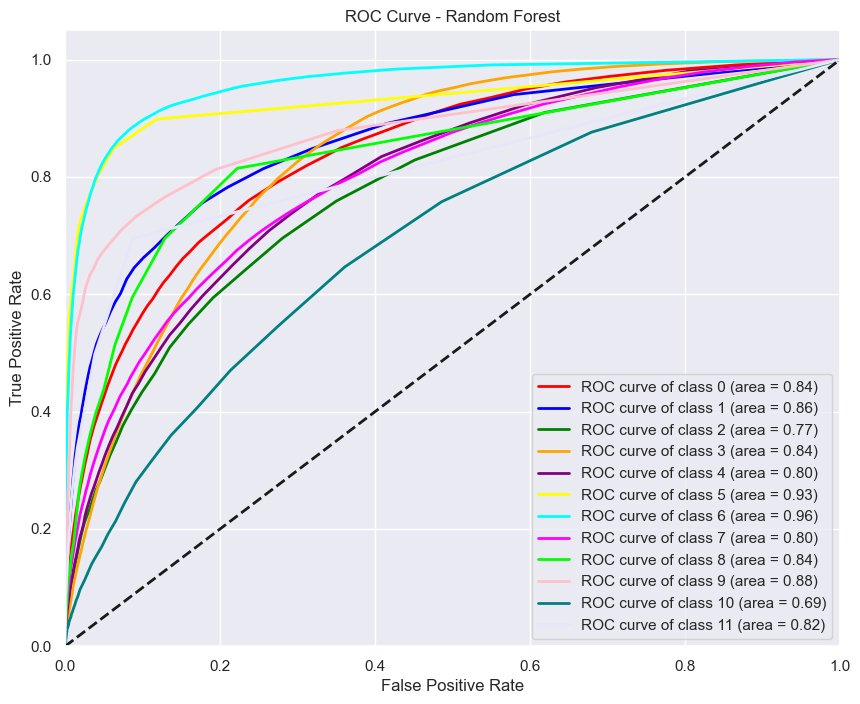

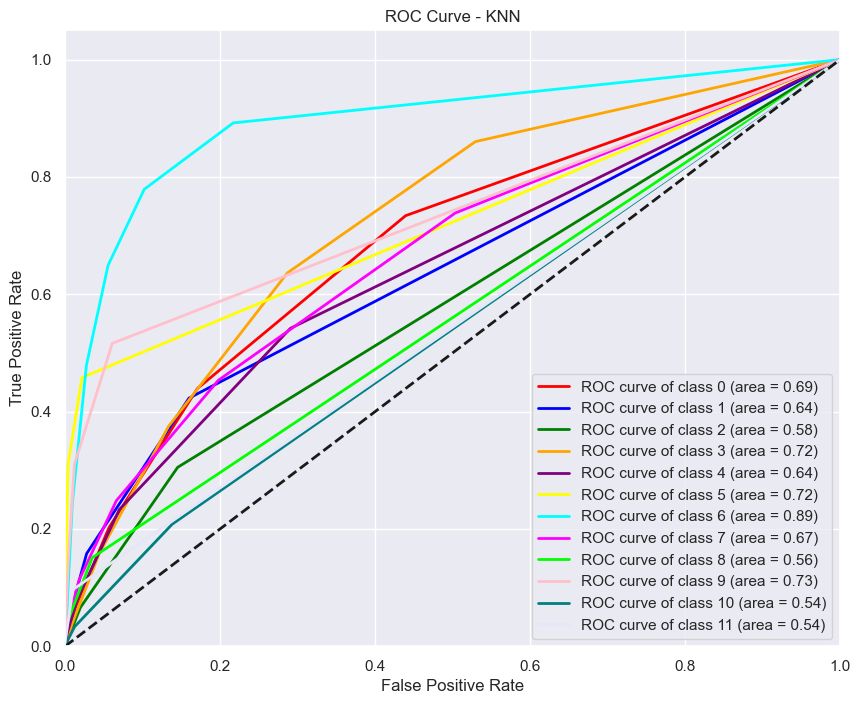

In [43]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)

# XGBoost model
import xgboost as xgb

xgb_model = xgb.XGBClassifier()

# random forest model
from sklearn.ensemble import RandomForestClassifier

rf_model = RandomForestClassifier()

# decision tree model
from sklearn.tree import DecisionTreeClassifier

dt_model = DecisionTreeClassifier()

#KNN model
from sklearn.neighbors import KNeighborsClassifier

knn_model = KNeighborsClassifier()

#Keras model ?

models = {
    'XGBoost': xgb_model,
    'Decision Tree': dt_model,
    'Random Forest': rf_model,
    'KNN': knn_model
}
auc_vals_dict = compare_models(models, y_train_encoded, y_val_encoded)

In [44]:
auc_vals_dict

{'XGBoost': 0.8740386155515822,
 'Decision Tree': 0.6283991730642454,
 'Random Forest': 0.835585708097922,
 'KNN': 0.6607338248369555}

we can see that the best model is the XGBoost model, we will use it for the next steps.

In [51]:
# use optuna to find the best hyperparameters for the XGBoost model
# we want to maximize the auc score
import optuna
from optuna.samplers import TPESampler
from sklearn.model_selection import cross_val_score
from sklearn.metrics import make_scorer


def objective(trial):
    xgb_params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 200),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 1),
        'subsample': trial.suggest_loguniform('subsample', 0.5, 1),
        'gamma': trial.suggest_loguniform('gamma', 0.01, 1),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'objective': 'multi:softmax',
        'num_class': len(label_encoder.classes_),
    }
    xgb_model = xgb.XGBClassifier(**xgb_params)
    return cross_val_score(xgb_model, X_train, y_train_encoded, n_jobs=-1, cv=3,
                           scoring=make_scorer(roc_auc_score, needs_proba=True, multi_class='ovr')).mean()


sampler = TPESampler(seed=42)
study = optuna.create_study(direction='maximize', sampler=sampler)
study.optimize(objective, n_trials=100)


after running the optuna we got the best hyperparameters for the XGBoost model:
 * 'n_estimators': 156, 'max_depth': 9
 * 'learning_rate': 0.11236596365407153 
 * 'subsample': 0.8925920206669298
 * 'gamma': 0.0605871121329831 
 * 'min_child_weight': 5

In [52]:
# train the model with the best hyperparameters
best_params = {'n_estimators': 156, 'max_depth': 9, 'learning_rate': 0.11236596365407153,
               'subsample': 0.8925920206669298, 'gamma': 0.0605871121329831, 'min_child_weight': 5}

best_xgb_model = xgb.XGBClassifier(**best_params)
best_xgb_model.fit(X_train, y_train_encoded)

y_pred_proba = best_xgb_model.predict_proba(X_val)
roc_auc_score(y_val_encoded, y_pred_proba, multi_class='ovr')


0.8800003881248207

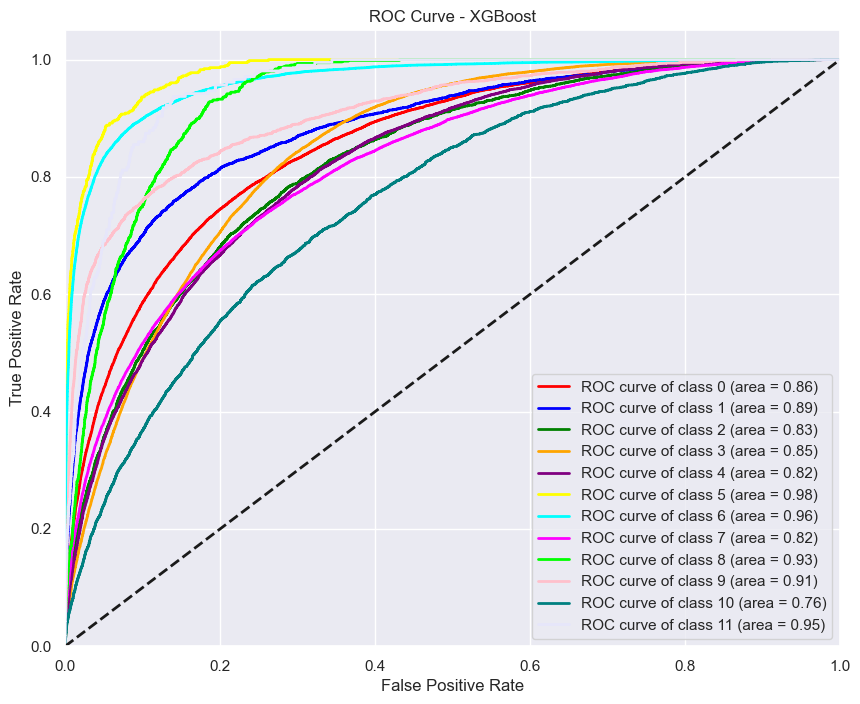

In [53]:
# graph the roc curve for the best model
roc_graph_for_models('XGBoost', y_val_encoded, y_pred_proba)

Trying Ensemble and Boosting Methods

In [58]:
# use ensemble method to improv the model auc result 
from sklearn.ensemble import VotingClassifier

voting_model = VotingClassifier(estimators=[('xgb', best_xgb_model), ('rf', rf_model), ('dt', dt_model), ('knn', knn_model)],
                                voting='soft')
voting_model.fit(X_train, y_train_encoded)
y_pred_proba = voting_model.predict_proba(X_val)
roc_auc_score(y_val_encoded, y_pred_proba, multi_class='ovr')

0.8574468118048095

In [70]:
# SAMME algorithm adaboost
from sklearn.ensemble import AdaBoostClassifier

weak_learner = xgb.XGBClassifier(**best_params)
n_estimators = 100

adaboost_clf = AdaBoostClassifier(
    estimator=weak_learner,
    n_estimators=n_estimators,
    algorithm="SAMME",
    random_state=42,
).fit(X_train, y_train_encoded)
y_pred_proba = adaboost_clf.predict_proba(X_val)
roc_auc_score(y_val_encoded, y_pred_proba, multi_class='ovr')

0.7633750138947583